In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_csv('global_power_plant_database.csv')
pd.set_option('display.max_columns', None)
df.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,other_fuel3,commissioning_year,owner,source,url,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_2018,generation_gwh_2019,generation_data_source,estimated_generation_gwh_2013,estimated_generation_gwh_2014,estimated_generation_gwh_2015,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,NaN,NaN,NaN,NaN,NaN,GEODB,http://globalenergyobservatory.org,GEODB,1009793,2017.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,123.77,162.90,97.39,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,NaN,NaN,NaN,NaN,NaN,Wiki-Solar,https://www.wiki-solar.org,Wiki-Solar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.43,17.48,18.25,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,NaN,NaN,NaN,NaN,NaN,Wiki-Solar,https://www.wiki-solar.org,Wiki-Solar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.64,17.58,19.10,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,NaN,NaN,NaN,NaN,NaN,GEODB,http://globalenergyobservatory.org,GEODB,1009795,2017.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,225.06,203.55,146.90,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,NaN,NaN,NaN,NaN,NaN,GEODB,http://globalenergyobservatory.org,GEODB,1009797,2017.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,406.16,357.22,270.99,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1


In [3]:
df.shape

(34936, 36)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 36 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   other_fuel1                     1944 non-null   object 
 9   other_fuel2                     276 non-null    object 
 10  other_fuel3                     92 non-null     object 
 11  commissioning_year              17447 non-null  float64
 12  owner                           

In [5]:
# Check for missing values
df.isnull().sum()

country                               0
country_long                          0
name                                  0
gppd_idnr                             0
capacity_mw                           0
latitude                              0
longitude                             0
primary_fuel                          0
other_fuel1                       32992
other_fuel2                       34660
other_fuel3                       34844
commissioning_year                17489
owner                             14068
source                               15
url                                  18
geolocation_source                  419
wepp_id                           18702
year_of_capacity_data             20049
generation_gwh_2013               28519
generation_gwh_2014               27710
generation_gwh_2015               26733
generation_gwh_2016               25792
generation_gwh_2017               25436
generation_gwh_2018               25299
generation_gwh_2019               25277


In [6]:
# Drop columns with more than 50% missing values
def drop_columns(df, threshold):
    for col in df.columns:
        if df[col].isnull().sum() > threshold:
            df.drop(col, axis=1, inplace=True)
    return df

df = drop_columns(df, 0.5*len(df))
print(df.shape)
print("The number of missing values in the dataset is: ", df.isnull().sum().sum())

(34936, 19)
The number of missing values in the dataset is:  33684


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   owner                           20868 non-null  object 
 9   source                          34921 non-null  object 
 10  url                             34918 non-null  object 
 11  geolocation_source              34517 non-null  object 
 12  estimated_generation_gwh_2016   

In [8]:
# Impute missing values
def impute_missing_values(df):
    # In case of numerical columns, replace missing values with mean
    for col in df.columns:
        if df[col].dtype != 'object':
            df[col] = df[col].fillna(df[col].mean())
    # In case of categorical columns, replace missing values with mode
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].fillna(df[col].mode()[0])
    return df

df = impute_missing_values(df)
print("The number of missing values in the dataset is: ", df.isnull().sum().sum())

The number of missing values in the dataset is:  0


In [9]:
# Check for duplicates
df.duplicated().sum()

0

# EDA


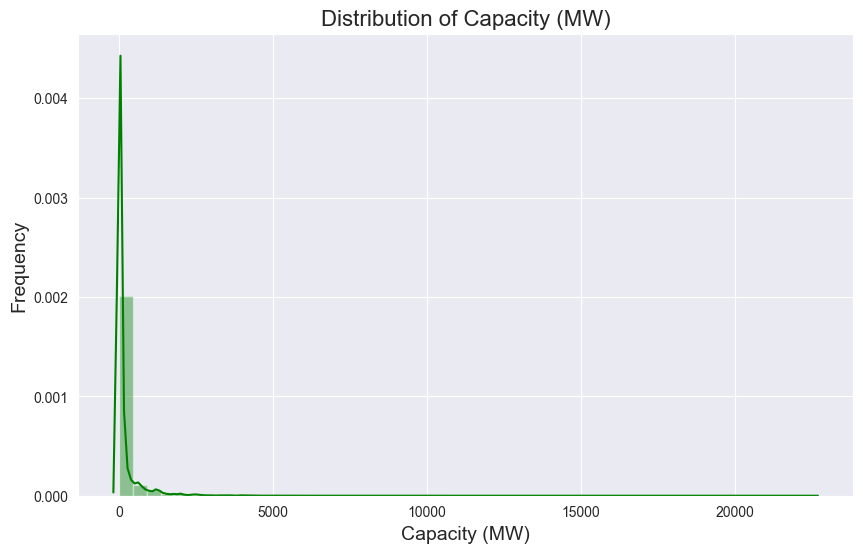

In [10]:
# Plotting the distribution of capacity_mw
sns.set_style('darkgrid')
plt.figure(figsize=(10, 6))
sns.distplot(df['capacity_mw'], color='green')
plt.title('Distribution of Capacity (MW)', fontsize=16)
plt.xlabel('Capacity (MW)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

In [11]:
# Plot a map of the world with the locations of power plants
import folium
from folium.plugins import MarkerCluster

# Create a base map
m = folium.Map(location=[20, 0], tiles='cartodbpositron', zoom_start=2)

# Add a marker for each power plant
mc = MarkerCluster()
for idx, row in df.iterrows():
    if not np.isnan(row['latitude']) and not np.isnan(row['longitude']):
        mc.add_child(folium.Marker([row['latitude'], row['longitude']]))
m.add_child(mc)

# Title
title_html = '''
            <h3 align="center" style="font-size:20px"><b>{}</b></h3>
            '''
m.get_root().html.add_child(folium.Element(title_html.format('Locations of Power Plants')))

# Display the map
m

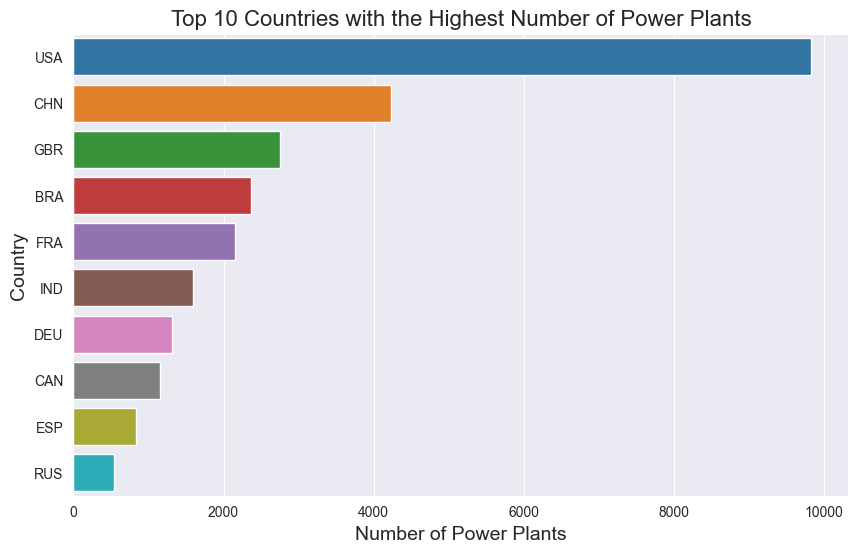

In [14]:
# Plot the top 10 countries with the highest number of power plants
plt.figure(figsize=(10, 6))
sns.countplot(y='country', data=df, order=df['country'].value_counts().index[:10])
plt.title('Top 10 Countries with the Highest Number of Power Plants', fontsize=16)
plt.xlabel('Number of Power Plants', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.show()

Text(0.5, 1.0, 'Top 10 Countries with the Highest Capacity')

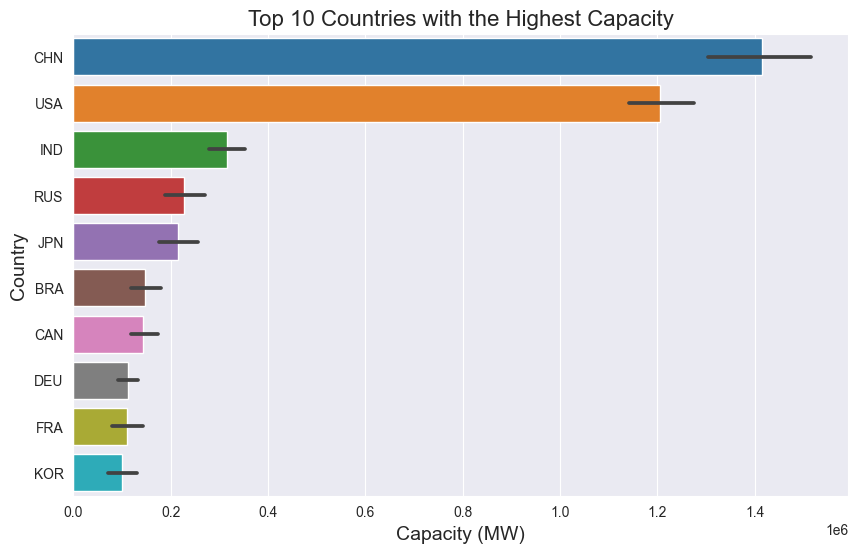

In [15]:
# Plot the top 10 countries with the highest capacity
plt.figure(figsize=(10, 6))
sns.barplot(x='capacity_mw', y='country', data=df, estimator=np.sum, order=df.groupby('country').sum()['capacity_mw'].sort_values(ascending=False).index[:10])
plt.title('Top 10 Countries with the Highest Capacity', fontsize=16)
plt.xlabel('Capacity (MW)', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.title('Top 10 Countries with the Highest Capacity', fontsize=16)

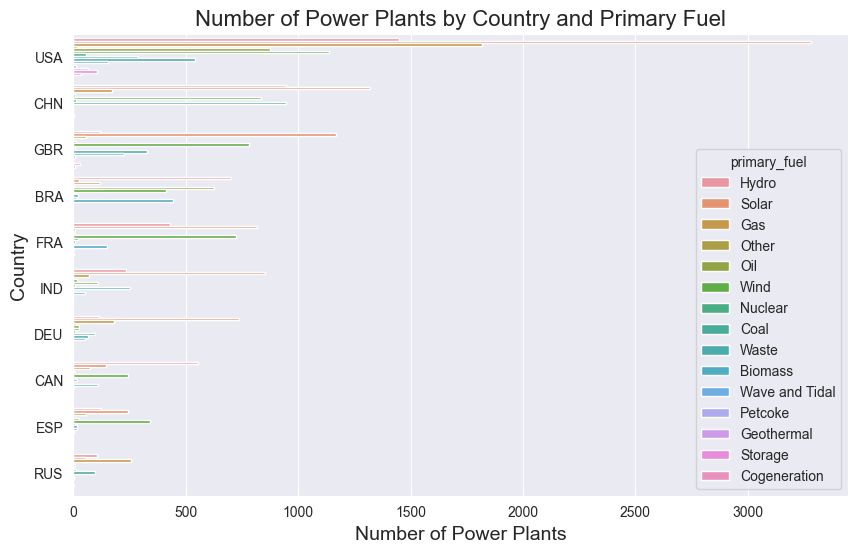

In [16]:
# Country vs primary fuel 
plt.figure(figsize=(10, 6))
# Interactive chart showing the number of power plants by country and primary fuel
sns.countplot(y='country', data=df, hue='primary_fuel', order=df['country'].value_counts().index[:10])
plt.title('Number of Power Plants by Country and Primary Fuel', fontsize=16)
plt.xlabel('Number of Power Plants', fontsize=14)
plt.ylabel('Country', fontsize=14)
plt.show()

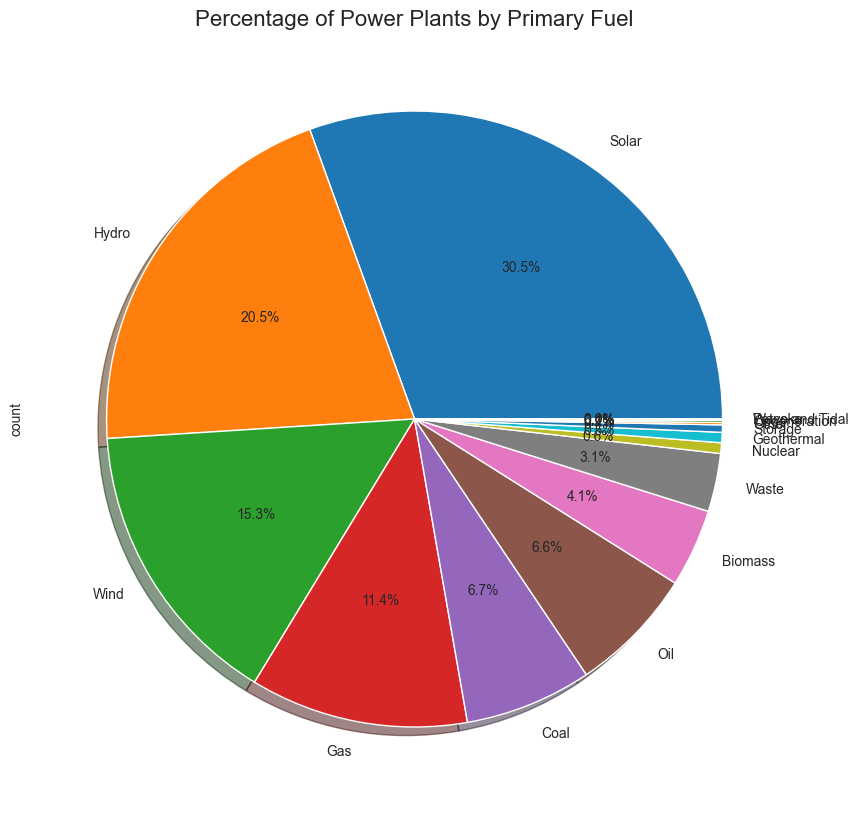

In [23]:
# Pie chart showing the percentage of power plants by primary fuel
plt.figure(figsize=(15, 10))
df['primary_fuel'].value_counts().plot.pie(autopct='%1.1f%%', shadow=True)
plt.title('Percentage of Power Plants by Primary Fuel', fontsize=16)
plt.show()

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34936 entries, 0 to 34935
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         34936 non-null  object 
 1   country_long                    34936 non-null  object 
 2   name                            34936 non-null  object 
 3   gppd_idnr                       34936 non-null  object 
 4   capacity_mw                     34936 non-null  float64
 5   latitude                        34936 non-null  float64
 6   longitude                       34936 non-null  float64
 7   primary_fuel                    34936 non-null  object 
 8   owner                           34936 non-null  object 
 9   source                          34936 non-null  object 
 10  url                             34936 non-null  object 
 11  geolocation_source              34936 non-null  object 
 12  estimated_generation_gwh_2016   

In [31]:
df.tail()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,owner,source,url,geolocation_source,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
34931,ZMB,Zambia,Ndola,WRI1022386,50.0,-12.9667,28.6333,Oil,ZESCO,Energy Regulation Board of Zambia,http://www.erb.org.zm/reports/EnergySectorRepo...,Power Africa,235.695265,183.79,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34932,ZMB,Zambia,Nkana,WRI1022384,20.0,-12.8167,28.2000,Oil,ZESCO,Energy Regulation Board of Zambia,http://www.erb.org.zm/reports/EnergySectorRepo...,Power Africa,235.695265,73.51,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34933,ZMB,Zambia,Victoria Falls,WRI1022380,108.0,-17.9167,25.8500,Hydro,ZESCO,Energy Regulation Board of Zambia,http://www.erb.org.zm/reports/EnergySectorRepo...,Power Africa,579.900000,578.32,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
34934,ZWE,Zimbabwe,Hwange Coal Power Plant Zimbabwe,GEODB0040404,920.0,-18.3835,26.4700,Coal,Cypress Creek Renewables,GEODB,http://globalenergyobservatory.org,GEODB,235.695265,2785.10,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,NO-ESTIMATION,CAPACITY-FACTOR-V1
34935,ZWE,Zimbabwe,Kariba Dam South Hydroelectric Power Station Z...,GEODB0003803,750.0,-16.5222,28.7619,Hydro,Cypress Creek Renewables,GEODB,http://globalenergyobservatory.org,GEODB,3428.650000,3960.24,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1


Text(0.5, 1.0, 'Top 10 Countries with the Highest Estimated Generation in 2017')

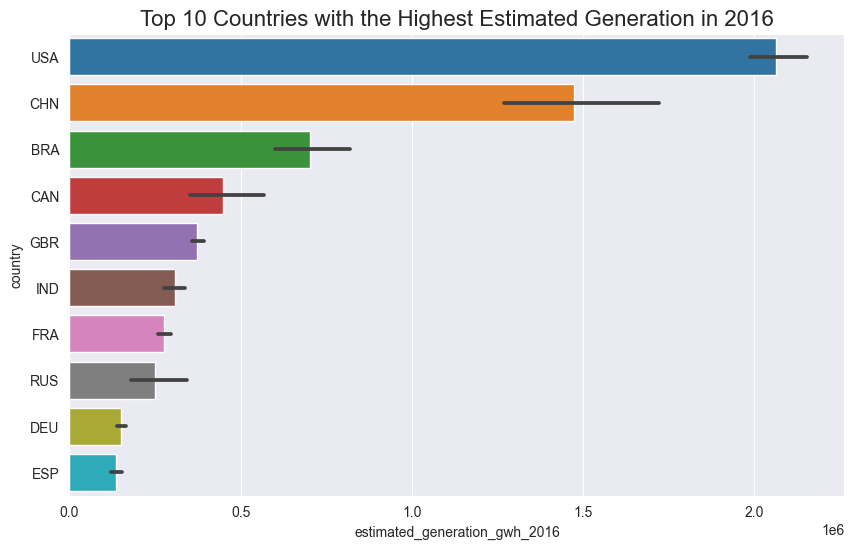

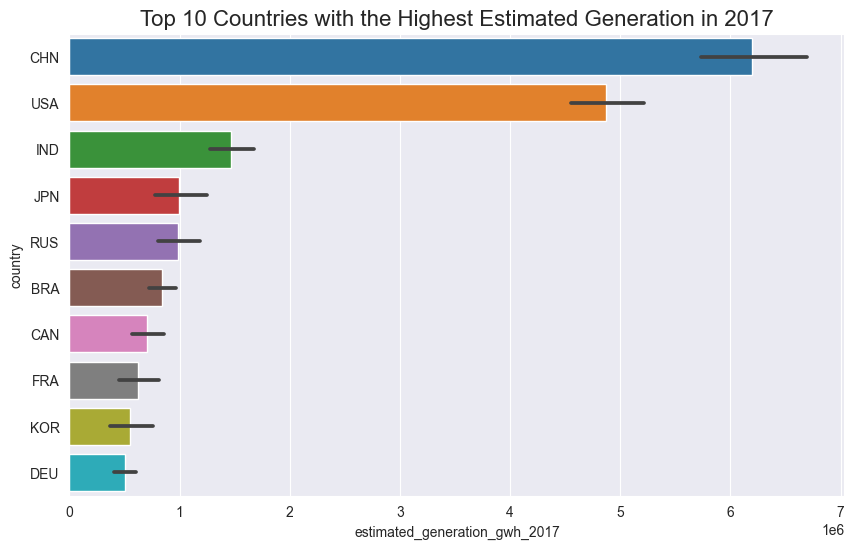

In [32]:
# estimated_generation_gwh_2016 vs estimated_generation_gwh_2017
plt.figure(figsize=(10, 6))
sns.barplot(x='estimated_generation_gwh_2016', y='country', data=df, estimator=np.sum, order=df.groupby('country').sum()['estimated_generation_gwh_2016'].sort_values(ascending=False).index[:10])
plt.title('Top 10 Countries with the Highest Estimated Generation in 2016', fontsize=16)

plt.figure(figsize=(10, 6))
sns.barplot(x='estimated_generation_gwh_2017', y='country', data=df, estimator=np.sum, order=df.groupby('country').sum()['estimated_generation_gwh_2017'].sort_values(ascending=False).index[:10])
plt.title('Top 10 Countries with the Highest Estimated Generation in 2017', fontsize=16)

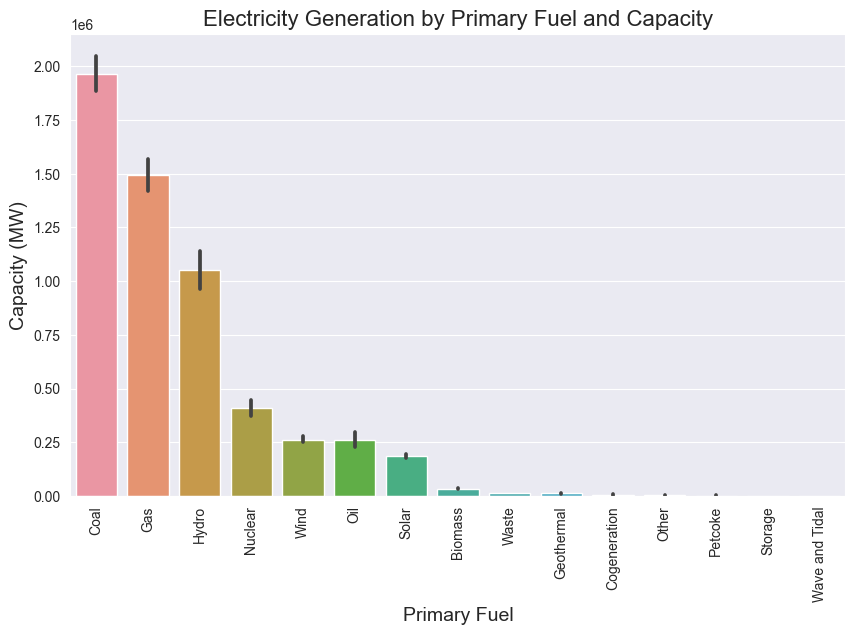

In [37]:
# Electricity generation by primary fuel and capacity
plt.figure(figsize=(10, 6))
sns.barplot(x='primary_fuel', y='capacity_mw', data=df, estimator=np.sum, order=df.groupby('primary_fuel').sum()['capacity_mw'].sort_values(ascending=False).index)
plt.title('Electricity Generation by Primary Fuel and Capacity', fontsize=16)
plt.xlabel('Primary Fuel', fontsize=14)
plt.ylabel('Capacity (MW)', fontsize=14)
plt.xticks(rotation='vertical');

In [41]:
# Descriptive statistics
df.describe()

,capacity_mw,latitude,longitude,estimated_generation_gwh_2016,estimated_generation_gwh_2017
count,34936.000000,34936.000000,34936.000000,34936.000000,34936.000000
mean,163.355148,32.816637,-6.972803,235.695265,716.443378
std,489.636072,22.638603,78.405850,893.227228,2419.585416
min,1.000000,-77.847000,-179.977700,0.300000,0.000000
25%,4.900000,29.256475,-77.641550,27.067500,8.960000
50%,16.745000,39.727750,-2.127100,235.695265,45.355000
75%,75.344250,46.263125,49.502675,235.695265,354.372500
max,22500.000000,71.292000,179.388700,60859.730000,82810.770000


<Axes: >

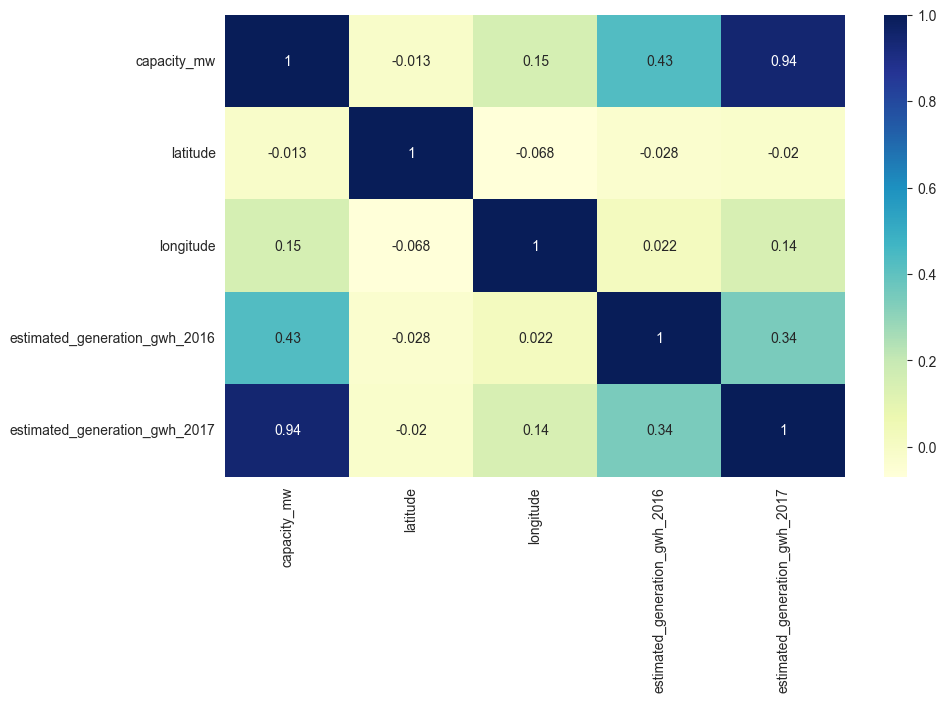

In [44]:
# Correlation matrix
corr = df.select_dtypes(include=np.number).corr()
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, cmap='YlGnBu');

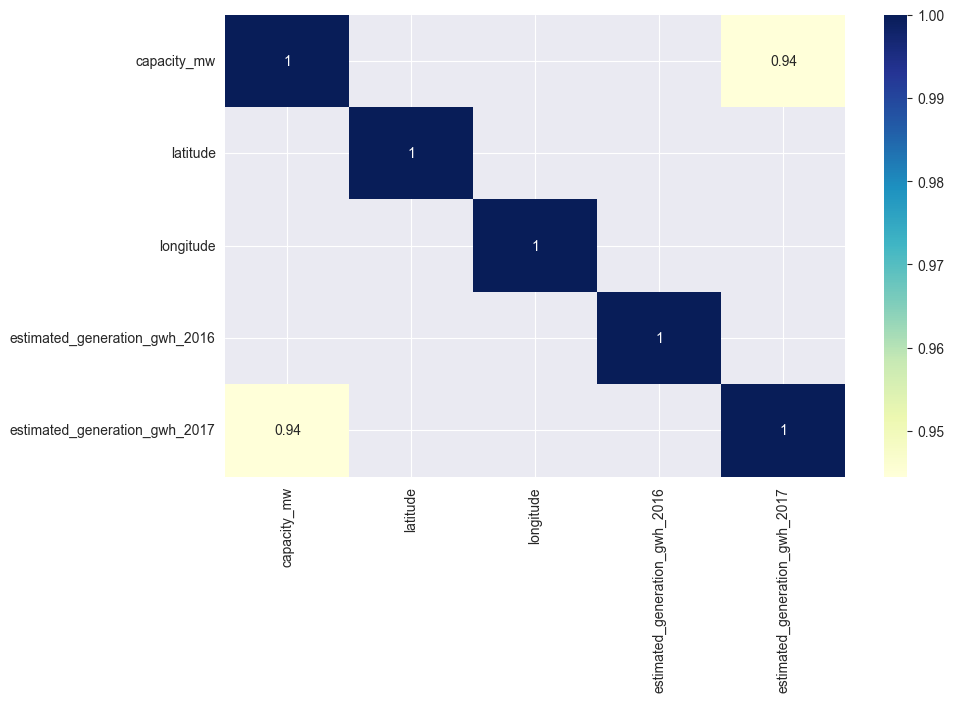

In [45]:
# Select only features with correlation greater than 0.5
corr = corr[corr > 0.5]
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, cmap='YlGnBu');

In [47]:
# List the features with correlation greater than 0.5
corr.columns

Index(['capacity_mw', 'latitude', 'longitude', 'estimated_generation_gwh_2016',
       'estimated_generation_gwh_2017'],
      dtype='object')

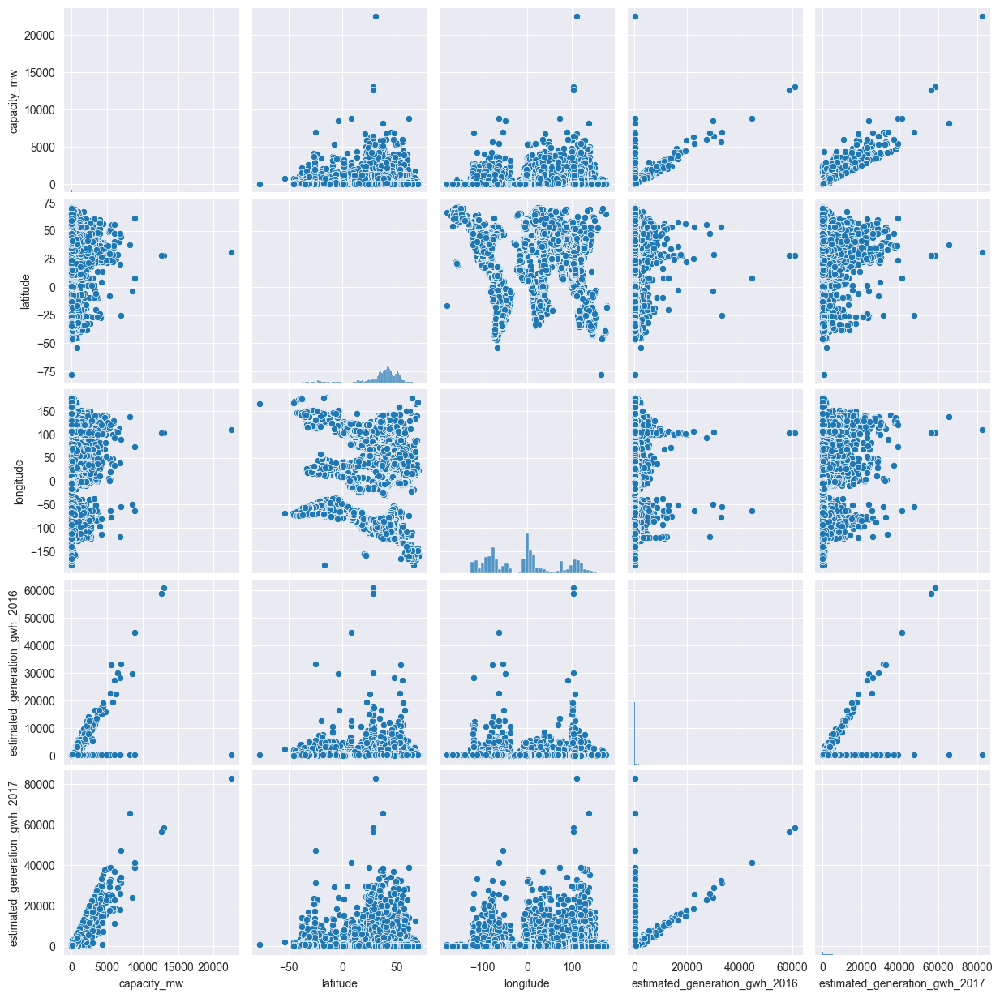

In [48]:
# Pairplot
sns.pairplot(df.select_dtypes(include=np.number));

In [49]:
df.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,owner,source,url,geolocation_source,estimated_generation_gwh_2016,estimated_generation_gwh_2017,estimated_generation_note_2013,estimated_generation_note_2014,estimated_generation_note_2015,estimated_generation_note_2016,estimated_generation_note_2017
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.0,32.322,65.1190,Hydro,Cypress Creek Renewables,GEODB,http://globalenergyobservatory.org,GEODB,137.76,119.50,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
1,AFG,Afghanistan,Kandahar DOG,WKS0070144,10.0,31.670,65.7950,Solar,Cypress Creek Renewables,Wiki-Solar,https://www.wiki-solar.org,Wiki-Solar,17.70,18.29,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
2,AFG,Afghanistan,Kandahar JOL,WKS0071196,10.0,31.623,65.7920,Solar,Cypress Creek Renewables,Wiki-Solar,https://www.wiki-solar.org,Wiki-Solar,17.62,18.72,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE,SOLAR-V1-NO-AGE
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.0,34.556,69.4787,Hydro,Cypress Creek Renewables,GEODB,http://globalenergyobservatory.org,GEODB,230.18,174.91,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.0,34.641,69.7170,Hydro,Cypress Creek Renewables,GEODB,http://globalenergyobservatory.org,GEODB,395.38,350.80,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1,HYDRO-V1


In [50]:
# Combine estimated generation for 2016 and 2017 to get the total estimated generation
df['estimated_generation_gwh'] = df['estimated_generation_gwh_2016'] + df['estimated_generation_gwh_2017']
df['estimated_generation_gwh'].head()

0    257.26
1     35.99
2     36.34
3    405.09
4    746.18
Name: estimated_generation_gwh, dtype: float64

In [51]:
# Predicting energy supply
# Import libraries
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Since the dataset contains both numerical and categorical features, we need to encode the categorical features
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df['country'])
df['country'] = le.transform(df['country'])

X = df[['capacity_mw', 'latitude', 'longitude', 'country']]
y = df['estimated_generation_gwh']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Scale the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)

# Predict the test set results
lr_y_pred = lr.predict(X_test)
print(lr_y_pred)

# Evaluate the model
mae = mean_absolute_error(y_test, lr_y_pred)
print("The mean absolute error is: ", mae)


  Using cached scikit_learn-1.2.2-cp311-cp311-win_amd64.whl (8.3 MB)
  Using cached joblib-1.2.0-py3-none-any.whl (297 kB)
  Using cached threadpoolctl-3.1.0-py3-none-any.whl (14 kB)
[  253.71935347   259.90532315 13149.4681746  ...   221.28427031
    83.00476674   267.24846137]
The mean absolute error is:  310.4272709454409


Text(0, 0.5, 'Predicted')

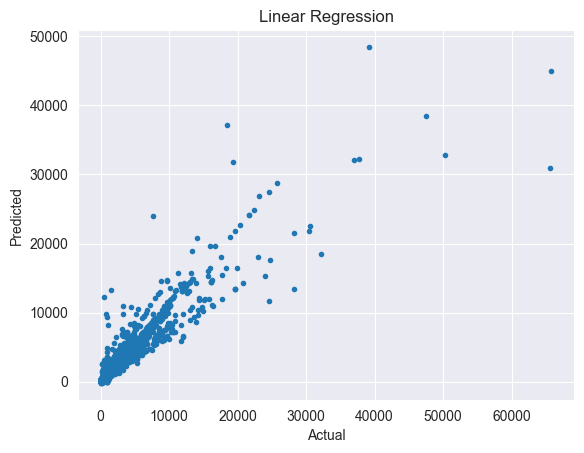

In [53]:
# Plot results
plt.plot(y_test, lr_y_pred, '.')
plt.title('Linear Regression')
plt.xlabel('Actual')
plt.ylabel('Predicted');

* From the scatter plot, we can see that the energy supply per capita and the number of citations are correlated.

In [54]:
# r2 score
print("The r2 score is: ", r2_score(y_test, lr_y_pred))

The r2 score is:  0.872820573037763


In [55]:
# Cross validation
lr_cv = cross_val_score(lr, X_train, y_train, cv=5) 
print("The cross validation score is: ", lr_cv)
print("The mean cross validation score is: ", lr_cv.mean())

The cross validation score is:  [0.86676255 0.89846665 0.88337461 0.87451752 0.85643498]
The mean cross validation score is:  0.8759112628614159


In [56]:
# Ridge Regression
ridge = Ridge()
ridge.fit(X_train, y_train)

# Predict the test set results
ridge_y_pred = ridge.predict(X_test)
print(ridge_y_pred)

# Evaluate the model
print("The mean absolute error is: ", mean_absolute_error(y_test, ridge_y_pred))
print("The mean squared error is: ", mean_squared_error(y_test, ridge_y_pred))
print("The r2 score is: ", r2_score(y_test, ridge_y_pred))
print("The cross validation score is: ", cross_val_score(ridge, X_train, y_train, cv=5))
print("The mean of the cross validation score is: ", cross_val_score(ridge, X_train, y_train, cv=5).mean())

[  253.72730137   259.91188442 13149.03329519 ...   221.29283025
    83.02632205   267.25199138]
The mean absolute error is:  310.41655891344396
The mean squared error is:  1000373.3826642355
The r2 score is:  0.8728206621462085
The cross validation score is:  [0.86675957 0.89847031 0.8833671  0.87451235 0.8564543 ]
The mean of the cross validation score is:  0.8759127254549899
